# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 44

**Author 1 (sciper):** Paul Véronique Guillaume DEVIANNE (311030)

**Author 2 (sciper):** Rizhong LIN (366842)

**Release date:** 08.03.2023  

**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [1]:
import tarfile
import os

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))

with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

../data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images.

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

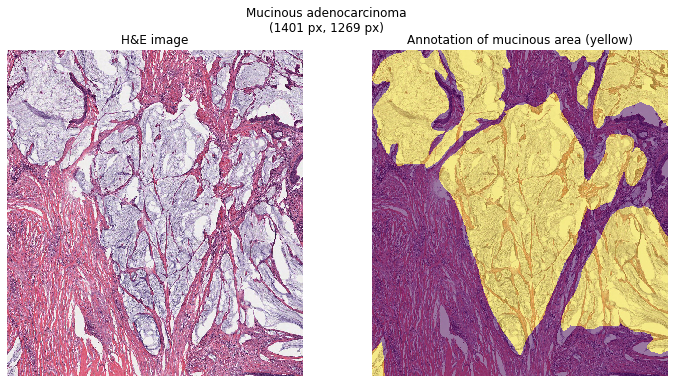

In [2]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

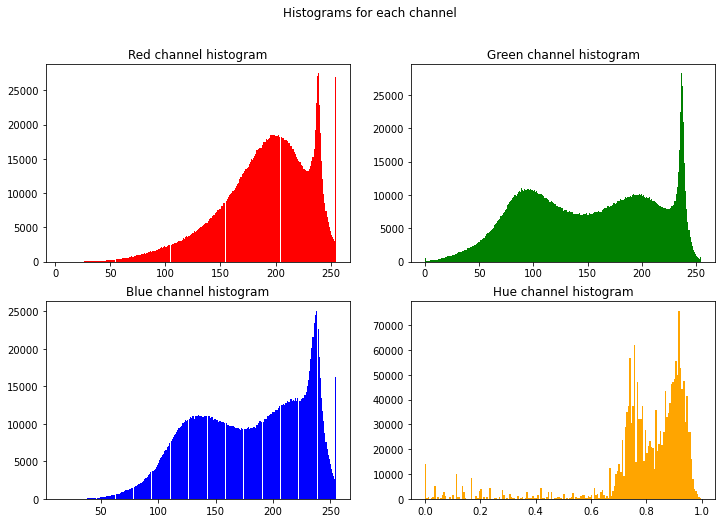

In [3]:
# Convert image to HSV color space
adeno_hsv = skimage.color.rgb2hsv(adeno_img)

# Extract hue channel
adeno_hue = adeno_hsv[:, :, 0]

# Display histograms for each channel
fig, ax = plt.subplots(2, 2, figsize=(12, 8), facecolor='white')

ax[0, 0].hist(adeno_img[:, :, 0].ravel(), bins=256, color='r')
ax[0, 0].set_title('Red channel histogram')

ax[0, 1].hist(adeno_img[:, :, 1].ravel(), bins=256, color='g')
ax[0, 1].set_title('Green channel histogram')

ax[1, 0].hist(adeno_img[:, :, 2].ravel(), bins=256, color='b')
ax[1, 0].set_title('Blue channel histogram')

ax[1, 1].hist(adeno_hue.ravel(), bins=180, color='orange')
ax[1, 1].set_title('Hue channel histogram')

plt.suptitle("Histograms for each channel")
plt.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

When it comes to finding the best threshold values for image thresholding, there are several methods available, each with its own advantages and disadvantages. The Otsu method is a popular algorithm that automatically calculates the optimal threshold by maximizing the separability of foreground and background pixels, which calculates the threshold value that maximizes the between-class variance of the foreground and background pixel intensities. The between-class variance can be computed as follows:

$$\sigma_b^2(t) = w_0(t)w_1(t)[\mu_0(t) - \mu_1(t)]^2$$

where $t$ is the threshold value, $w_0(t)$ and $w_1(t)$ are the probabilities of the background and foreground regions, respectively, for a given threshold $t$. However, it may not work well for images with uneven lighting or complex backgrounds.

In our own implementation, we first tried to use the Otsu method to find the optimal threshold for each channel, but we weren't satisfied with the results. So we decided to use the comprehensive traversal method, which involves manually iterating through a range of thresholds for each channel and testing each one to find the optimal threshold. This method allowed us to fine-tune the thresholds and achieve better results, although it took more time and computational resources.

We recorded the error for each threshold and created a line graph to visualize the results. We then applied the best threshold of each channel and plotted the mask of each channel and the ground truth to evaluate the performance. Overall, we found that the comprehensive traversal method worked better for our image thresholding task and allowed us to achieve more accurate results by fine-tuning the thresholds.

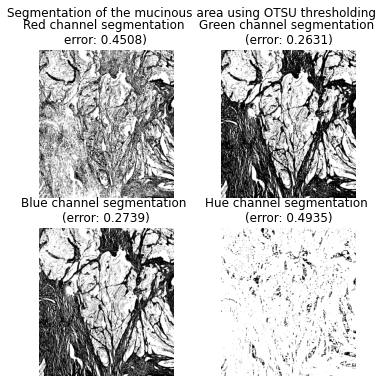

In [4]:
from skimage.color import rgb2hsv
from skimage.filters import threshold_otsu, threshold_multiotsu


def compute_error(msk, gt):
    return (1 - np.mean(msk == gt)).round(4)


# Convert RGB to HSV
hsv_image = rgb2hsv(adeno_img)
hue = hsv_image[:, :, 0]  # 0-1
red = adeno_img[:, :, 0]  # 0-255
green = adeno_img[:, :, 1]  # 0-255
blue = adeno_img[:, :, 2]  # 0-255


# Below are the thresholds generated by the Otsu method
red_threshold = threshold_otsu(red)  # 181
green_threshold = threshold_otsu(green)  # 150
blue_threshold = threshold_otsu(blue)  # 175
hue_threshold = threshold_otsu(hue)  # 0.5130603608630953

# Apply thresholding
mask_red = red > red_threshold
mask_green = green > green_threshold
mask_blue = blue > blue_threshold
mask_hue = hue > hue_threshold  

error_red = compute_error(mask_red, adeno_gt)
error_green = compute_error(mask_green, adeno_gt)
error_blue = compute_error(mask_blue, adeno_gt)
error_hue = compute_error(mask_hue, adeno_gt)

fig, ax = plt.subplots(2, 2, figsize=(6,6), facecolor='white')

ax[0, 0].imshow(mask_red, cmap='gray')
ax[0, 0].set_title('Red channel segmentation \nerror: {})'.format(error_red))
ax[0, 0].axis('off')

ax[0, 1].imshow(mask_green, cmap='gray')
ax[0, 1].set_title('Green channel segmentation \n(error: {})'.format(error_green))
ax[0, 1].axis('off')

ax[1, 0].imshow(mask_blue, cmap='gray')
ax[1, 0].set_title('Blue channel segmentation \n(error: {})'.format(error_blue))
ax[1, 0].axis('off')

ax[1, 1].imshow(mask_hue, cmap='gray')
ax[1, 1].set_title('Hue channel segmentation \n(error: {})'.format(error_hue))
ax[1, 1].axis('off')

plt.suptitle("Segmentation of the mucinous area using OTSU thresholding")
plt.show()



Best thresholds and errors for each channel:
{'red': {'threshold': 193, 'error': 0.448}, 'green': {'threshold': 145, 'error': 0.2621}, 'blue': {'threshold': 176, 'error': 0.2738}, 'hue': {'threshold': 0.8352941176470589, 'error': 0.1991}}


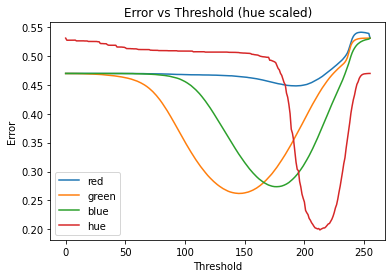

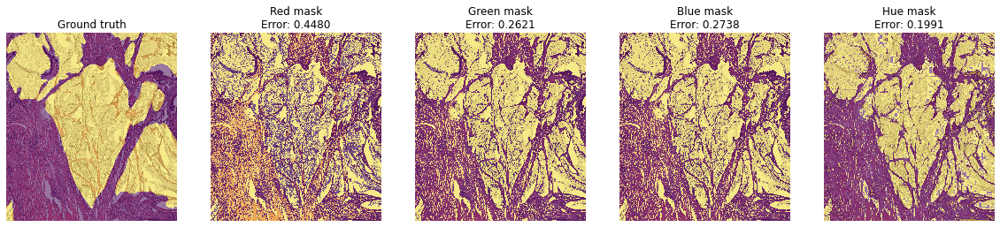

In [5]:
# For each channel, traverse the histogram and find the best threshold,
#   compute the error, record the error for each threshold, and generate a whole line chart
# For r, g, b, we take values greater than the threshold; for h, we take values less than the threshold
# Because we found that the mucinous area is darker than the rest of the image

import pandas as pd  # For plotting

best_configs = {'red': {'threshold': 0, 'error': 1}, 'green': {'threshold': 0, 'error': 1},
                'blue': {'threshold': 0, 'error': 1}, 'hue': {'threshold': 0, 'error': 1}}

# First, find the best threshold for r, g, b
red_errors = []
green_errors = []
blue_errors = []
for r in range(0, 256):
    mask_red = red > r
    error = compute_error(mask_red, adeno_gt)
    red_errors.append(error)
    if error < best_configs['red']['error']:
        best_configs['red']['threshold'] = r
        best_configs['red']['error'] = error

for g in range(0, 256):
    mask_green = green > g
    error = compute_error(mask_green, adeno_gt)
    green_errors.append(error)
    if error < best_configs['green']['error']:
        best_configs['green']['threshold'] = g
        best_configs['green']['error'] = error

for b in range(0, 256):
    mask_blue = blue > b
    error = compute_error(mask_blue, adeno_gt)
    blue_errors.append(error)
    if error < best_configs['blue']['error']:
        best_configs['blue']['threshold'] = b
        best_configs['blue']['error'] = error

# Then, find the best threshold for h
hue_errors = []
for h in range(0, 256):
    mask_hue = hue < h / 255
    error = compute_error(mask_hue, adeno_gt)
    hue_errors.append(error)
    if error < best_configs['hue']['error']:
        best_configs['hue']['threshold'] = h / 255
        best_configs['hue']['error'] = error

# Combine the errors and draw the line chart
df = pd.DataFrame({'red': red_errors, 'green': green_errors, 'blue': blue_errors, 'hue': hue_errors})
# Edit the title and axis labels, mention in the title that hue is scaled to 0-1
df.plot(title='Error vs Threshold (hue scaled)', xlabel='Threshold', ylabel='Error')

# Print the best thresholds and errors for each channel
print("Best thresholds and errors for each channel:")
print(best_configs)


# Apply each channel's best threshold, and plot each channel's mask, and the ground truth
mask_red = red > best_configs['red']['threshold']
mask_green = green > best_configs['green']['threshold']
mask_blue = blue > best_configs['blue']['threshold']
mask_hue = hue < best_configs['hue']['threshold']

fig, ax = plt.subplots(1, 5, figsize=(20, 20), facecolor='white')

ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[0].set_title('Ground truth'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(mask_red, alpha=0.5, interpolation='nearest')
ax[1].set_title('Red mask\nError: {:.4f}'.format(best_configs['red']['error']))
ax[1].axis('off')

ax[2].imshow(adeno_img, interpolation='nearest')
ax[2].imshow(mask_green, alpha=0.5, interpolation='nearest')
ax[2].set_title('Green mask\nError: {:.4f}'.format(best_configs['green']['error']))
ax[2].axis('off')

ax[3].imshow(adeno_img, interpolation='nearest')
ax[3].imshow(mask_blue, alpha=0.5, interpolation='nearest')
ax[3].set_title('Blue mask\nError: {:.4f}'.format(best_configs['blue']['error']))
ax[3].axis('off')

ax[4].imshow(adeno_img, interpolation='nearest')
ax[4].imshow(mask_hue, alpha=0.5, interpolation='nearest')
ax[4].set_title('Hue mask\nError: {:.4f}'.format(best_configs['hue']['error']))
ax[4].axis('off')

plt.show()


#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

In [6]:
# TODO: replace variable with your own threshold
mask_thresholding = mask_hue

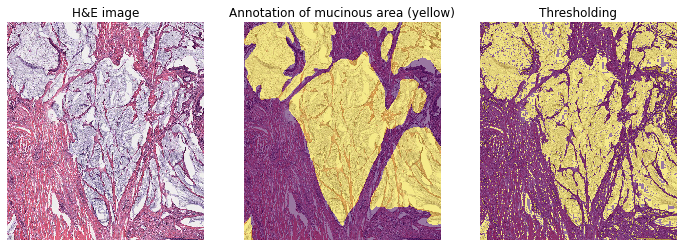

In [7]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5), facecolor='white')

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(adeno_img, interpolation='nearest')
ax[2].imshow(mask_thresholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. **Save the mask as the variable `mask_morph`**

#### 1.3.1 Morphology with Closing and Opening

In this part, we have applied morphological operations (closing and/or opening) to the thresholded image mask in order to improve the segmentation of the mucinous area.

Original error: 0.1991


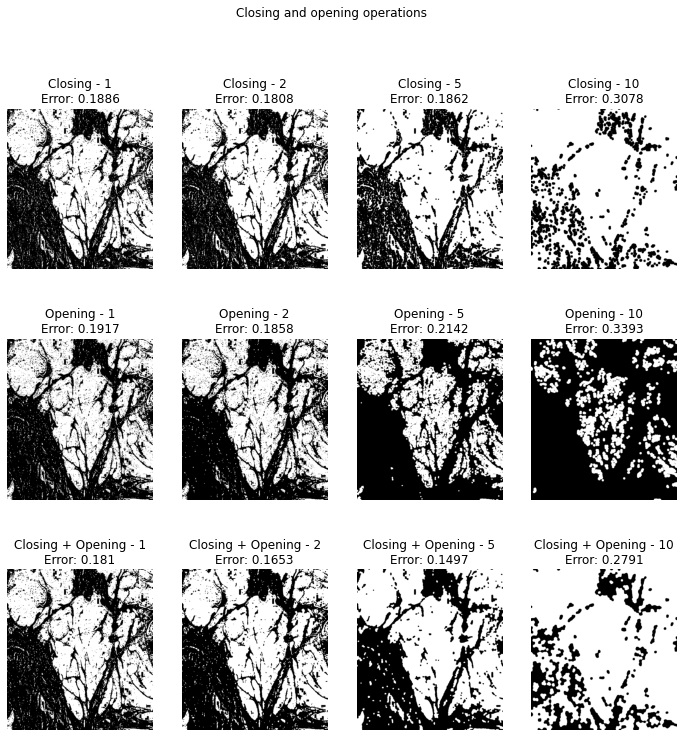

Best error: 0.1497
Best config: {'disk_size': 5, 'closing': True, 'opening': True, 'error': 0.1497}


In [8]:
# A: Closing and opening

from skimage.morphology import disk, closing, opening

fig, ax = plt.subplots(3, 4, figsize=(12, 12))
plt.suptitle("Closing and opening operations")

# Define initial variables
mask_morph = mask_thresholding.copy()
error_morph = compute_error(mask_morph, adeno_gt)

# Define the best configuration so far
best_config_A = {"disk_size": 1, "closing": True, "opening": True, "error": error_morph}
best_mask_A = mask_morph.copy()

# Define the list of disk sizes to try
disk_sizes = [1, 2, 5, 10]

# Print original error
print("Original error:", error_morph)

# Iterate over the disk sizes and perform opening and closing operations
for i, disk_size in enumerate(disk_sizes):
    # Perform closing and opening operations
    closed = closing(mask_morph, selem=disk(disk_size))
    opened = opening(mask_morph, selem=disk(disk_size))
    closed_opened = opening(closing(mask_morph, selem=disk(disk_size)), selem=disk(disk_size))

    ax[0, i].imshow(closed, cmap='gray')
    ax[0, i].set_title('Closing - {}\nError: {}'.format(disk_size, compute_error(closed, adeno_gt)))
    ax[0, i].axis('off')

    ax[1, i].imshow(opened, cmap='gray')
    ax[1, i].set_title('Opening - {}\nError: {}'.format(disk_size, compute_error(opened, adeno_gt)))
    ax[1, i].axis('off')

    ax[2, i].imshow(closed_opened, cmap='gray')
    ax[2, i].set_title('Closing + Opening - {}\nError: {}'.format(disk_size, compute_error(closed_opened, adeno_gt)))
    ax[2, i].axis('off')

    # Iterate over the masks and calculate errors
    for j, mask in enumerate([closed, opened, closed_opened]):
        error = compute_error(mask, adeno_gt)

        # Update the best configuration if the error is smaller
        if error < best_config_A["error"]:
            best_config_A = {"disk_size": disk_size, "closing": j != 1, "opening": j != 0, "error": error}
            best_mask_A = mask

plt.show()

# Print the best error and configuration
print("Best error: {}".format(best_config_A["error"]))
print("Best config: {}".format(best_config_A))

# Update the morphological mask
mask_morph_A = best_mask_A.copy()

##### Comments on the quality of the results

We can see from the above figure that both closing and opening operations can be helpful in smoothing and filling the gaps in the mask.
We can observe that as we increase the size of the disk, the mask becomes smoother,
but at the same time it may fill more holes, which can be either good or bad depending on the desired output.

#### 1.3.2 Morphology with Removing Small Holes and Objects

In this part, we are performing morphological operations to remove small holes and/or objects from a binary mask.

Original error: 0.1991
Best error: 0.1382
Best config: {'size': 500, 'holes': True, 'objects': True, 'error': 0.1382}


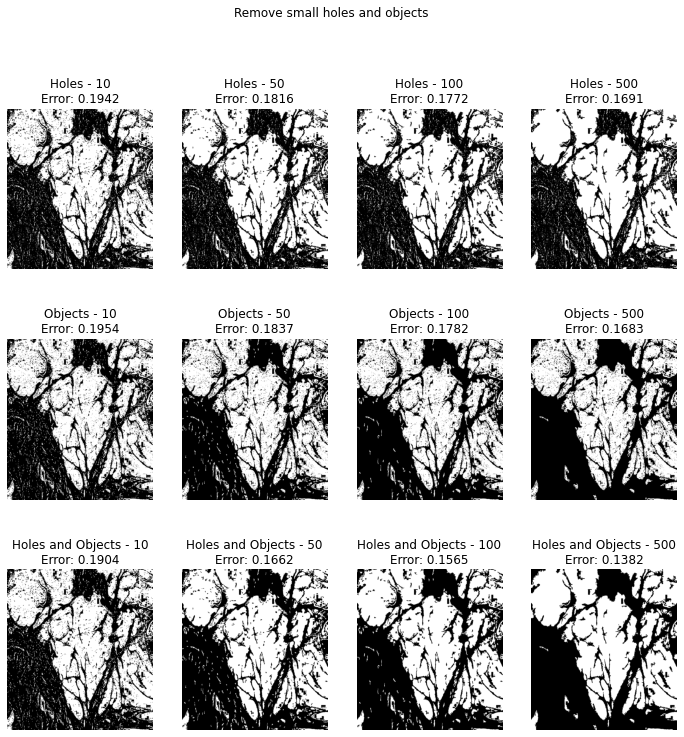

In [9]:
# B: Remove small holes and objects

from skimage.morphology import remove_small_holes, remove_small_objects

# Define initial variables
mask_morph = mask_morph.copy()
error_morph = compute_error(mask_morph, adeno_gt)

fig, ax = plt.subplots(3, 4, figsize=(12, 12))
plt.suptitle("Remove small holes and objects")

# Define the best configuration so far
best_config_B = {"size": 10, "error": error_morph}
best_mask_B = mask_morph.copy()

# Define the list of sizes to try
sizes = [10, 50, 100, 500]

# Print original error
print("Original error:", error_morph)

# Iterate over the sizes and perform hole and object removal operations
for i, size in enumerate(sizes):
    # Perform hole and object removal operations
    holes = remove_small_holes(mask_morph, area_threshold=size)
    objects = remove_small_objects(mask_morph, min_size=size)
    holes_objects = remove_small_objects(remove_small_holes(mask_morph, area_threshold=size), min_size=size)

    ax[0, i].imshow(holes, cmap='gray')
    ax[0, i].set_title('Holes - {}\nError: {}'.format(size, compute_error(holes, adeno_gt)))
    ax[0, i].axis('off')

    ax[1, i].imshow(objects, cmap='gray')
    ax[1, i].set_title('Objects - {}\nError: {}'.format(size, compute_error(objects, adeno_gt)))
    ax[1, i].axis('off')

    ax[2, i].imshow(holes_objects, cmap='gray')
    ax[2, i].set_title('Holes and Objects - {}\nError: {}'.format(size, compute_error(holes_objects, adeno_gt)))
    ax[2, i].axis('off')

    # Iterate over the masks and calculate errors
    for k, mask in enumerate([holes, objects, holes_objects]):
        error = compute_error(mask, adeno_gt)

        # Update the best configuration if the error is smaller
        if error < best_config_B["error"]:
            best_config_B = {"size": size, "holes": k != 1, "objects": k != 0, "error": error}
            best_mask_B = mask

# Print the best error and configuration
print("Best error: {}".format(best_config_B["error"]))
print("Best config: {}".format(best_config_B))

# Update the morphological mask
mask_morph_B = best_mask_B.copy()


##### Comments on the quality of the results

We can see from the above figure that removing small holes and objects can be helpful in removing noise from the mask.
When we increase the size of the holes and objects to be removed, the mask becomes smoother;
larger values for size result in a more accurate mask, as smaller values may remove parts of the mucinous area.

We can observe that `remove_small_objects` generally gives better results than `remove_small_holes`,
but it would be better if we could combine the two operations.


#### 1.3.3 Morphology with Closing + Opening and Removing Small Holes and Objects

For the closing + opening operation, we tried different disk sizes of 1, 2, 5, and 10. Similarly, we tried different sizes of 10, 50, 100, and 500 for removing small holes and objects. However, we found that larger values, specifically 6000, performed better than the instructed range.

In Part C, we combined the two functions to find the best result. We used a slice size of 5 for both closing and opening, followed by the removal of small objects and holes with a minimum size of 6000. This resulted in a morphological mask with the lowest error rate. We displayed the best result with its error rate compared to the ground truth for visual analysis.

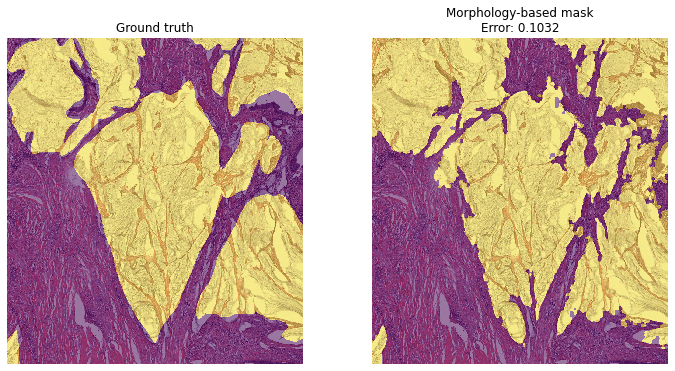

In [10]:
# Best A: {'disk_size': 5, 'closing': True, 'opening': True, 'error': 0.1497}
# Best B: {'size': 500, 'holes': True, 'objects': True, 'error': 0.1382}

# C: Combine the functions to improve the results
selem = disk(5)
closed_img = closing(mask_thresholding, selem)
opened_img = opening(closed_img, selem)
mask_morph = remove_small_objects(remove_small_holes(opened_img, area_threshold=6000), min_size=6000)
morph_error = compute_error(mask_morph, adeno_gt)

# Display the best result and its error
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[0].set_title('Ground truth')
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(mask_morph, alpha=0.5, interpolation='nearest')
ax[1].set_title('Morphology-based mask\nError: {:.4f}'.format(morph_error))
ax[1].axis('off')

plt.show()

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

In the `region_growing` function, we used `skimage.morphology.binary_dilation`, a function from the Scikit-image library that performs morphological dilation on binary images. In the context of the region growing algorithm, binary dilation is used to expand the region map by one pixel around its boundaries. The initial region map is from the previous thresholding operations.

Morphological dilation is an image processing operation that works by sliding a structuring element (usually a small binary matrix) over the input binary image. For each pixel in the image, the dilation operation computes the logical OR between the image pixels and the structuring element centered on that pixel. If at least one pixel in the structuring element overlaps a foreground (true) pixel in the image, the center pixel of the output image is set to true (foreground). In this way, dilation expands the boundaries of the foreground regions in the image.

We manually set up the seed points according to the image and the ground truth. We then iteratively expand the region map by one pixel around its boundaries and update the region map with the logical AND between the intensity mask and the expanded region map. We repeat this process until the region map does not change anymore. The final region map is returned as the mask.

We found that the more seed points we use, the better the results. However, we also found that the results are not always consistent. Sometimes, the region growing algorithm can produce a mask with a higher error rate than the morphological mask. This is likely due to the fact that the region growing algorithm is not deterministic, and the results can vary depending on the seed points used.

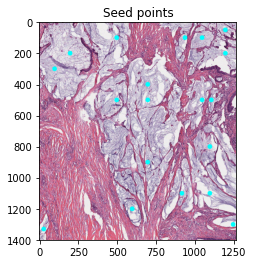

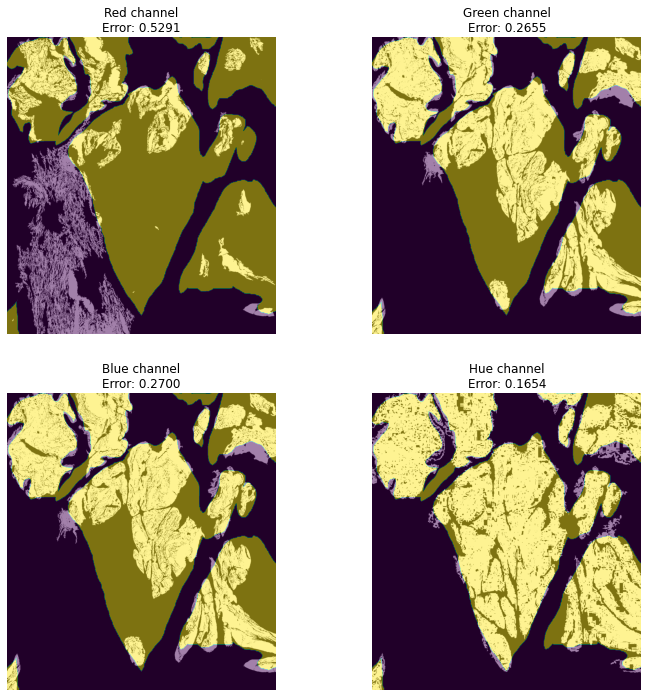

In [11]:
import numpy as np
from skimage.color import rgb2gray
import skimage.morphology

def region_growing(seed_points, intensity_mask):
    region_map = np.zeros_like(intensity_mask, dtype=bool)

    for seed in seed_points:
        region_map[seed] = True
        change_detected = True

        while change_detected:
            change_detected = False
            previous_region_map = region_map.copy()
            expanded_region = skimage.morphology.binary_dilation(region_map)
            updated_region_map = intensity_mask & expanded_region

            if np.any(region_map != updated_region_map):
                region_map = updated_region_map
                change_detected = True

    return region_map

seed_points = [
    (50, 1200),
    (100, 500),
    (100, 940),
    (100, 1050),
    (200, 200),
    (200, 1200),
    (300, 100),
    (400, 700),
    (500, 500),
    (500, 700),
    (500, 1050),
    (500, 1110),
    (800, 1100),
    (900, 700),
    (1100, 920),
    (1100, 1100),
    (1200, 600),
    (1300, 1250),
    (1330, 30),
]

# Plot the seed points on the original image
seed_points_img = adeno_img.copy()
import cv2
for seed in seed_points:
    # Draw a circle on the image
    cv2.circle(seed_points_img, (seed[1], seed[0]), 15, (0, 255, 255), -1)

# Plot the image with the seed points
plt.imshow(seed_points_img)
plt.title('Seed points')
plt.show()

# Apply the region-growing algorithm to each channel (R, G, B, and H)
red_region = region_growing(seed_points, mask_red)
green_region = region_growing(seed_points, mask_green)
blue_region = region_growing(seed_points, mask_blue)
hue_region = region_growing(seed_points, mask_hue)

# Plot the results of the region-growing algorithm in each channel
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(red_region, cmap='gray')
ax[0, 0].imshow(adeno_gt, alpha=0.5)
red_error_rg = compute_error(red_region, adeno_gt)
ax[0, 0].set_title('Red channel\nError: {:.4f}'.format(red_error_rg))
ax[0, 0].axis('off')

ax[0, 1].imshow(green_region, cmap='gray')
ax[0, 1].imshow(adeno_gt, alpha=0.5)
green_error_rg = compute_error(green_region, adeno_gt)
ax[0, 1].set_title('Green channel\nError: {:.4f}'.format(green_error_rg))
ax[0, 1].axis('off')

ax[1, 0].imshow(blue_region, cmap='gray')
ax[1, 0].imshow(adeno_gt, alpha=0.5)
blue_error_rg = compute_error(blue_region, adeno_gt)
ax[1, 0].set_title('Blue channel\nError: {:.4f}'.format(blue_error_rg))
ax[1, 0].axis('off')

ax[1, 1].imshow(hue_region, cmap='gray')
ax[1, 1].imshow(adeno_gt, alpha=0.5)
hue_error_rg = compute_error(hue_region, adeno_gt)
ax[1, 1].set_title('Hue channel\nError: {:.4f}'.format(hue_error_rg))
ax[1, 1].axis('off')


# Get the best channel and the mask, name it mask_region
best_channel = np.argmin([red_error_rg, green_error_rg, blue_error_rg, hue_error_rg])
mask_region = [red_region, green_region, blue_region, hue_region][best_channel]


---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

The thresholding technique is the simplest and fastest method, but it lacks accuracy. On the other hand, the morphological approach is more accurate, but takes longer to process. The accuracy of the region growing method is affected by the choice of seed points. In this case, the region growing method resulted in a mask with a higher error rate compared to the morphological mask. This is due to the non-deterministic nature of the region growing algorithm, which means that the result can vary depending on the seed points chosen.

In this case, **the best method should be all three methods combined**. The thresholding method can be used to remove the background, and the morphological method can be used to remove the small objects. The region growing method can be used to fill in the gaps between the objects. This combination of methods can be used to create a mask with high accuracy and low processing time. But as for a single method, the morphological method is the best choice.

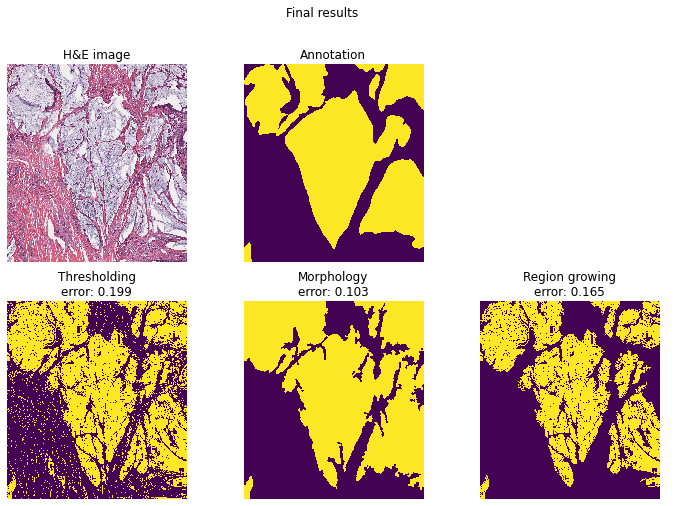

In [12]:
error_th = 1 - (mask_thresholding == adeno_gt).mean()
error_morph = 1 - (mask_morph == adeno_gt).mean()
error_region = 1 - (mask_region == adeno_gt).mean()

# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thresholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))

# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))

[a.axis('off') for a in ax.ravel()]

plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image).

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments.
**Using this image as reference** 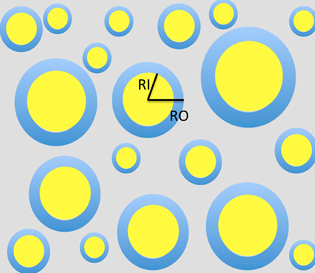

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 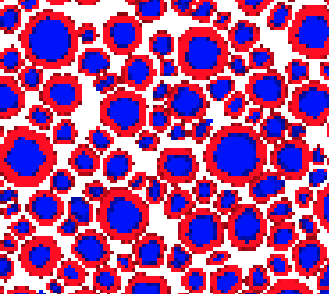

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)**
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**

Try to be specific, not necessarily long. In the discussion include:
 1. What worked?
 2. What did not work?
 3. Why do you think it does not work?
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning"

**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

In [13]:
data_base_path

'../data'

../data


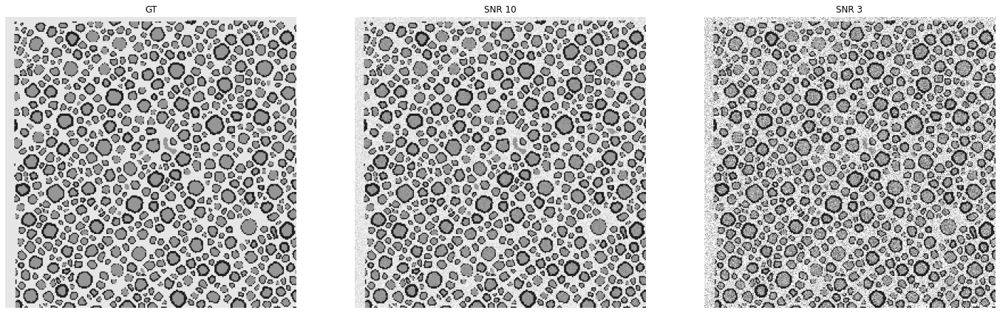

In [14]:
import cv2
import matplotlib.pyplot as plt

data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/'

files = ["GT_0.png", "test_0_0.png", "test_0_1.png"]
gt_0 = cv2.imread(path_folder + files[0])
snr_10 = cv2.imread(path_folder + files[1])
snr_3 = cv2.imread(path_folder + files[2])

images = [gt_0, snr_10, snr_3]
im_names = ["GT", "SNR 10", "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12), facecolor='white')
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing

A common-way of annihilating low SNR effects is to use a Gaussian or a medium blur. It reduces the noise of the image by smoothing the gray local pixels (the granularity). We will use a Gaussian blur **and** a median blur. After trying different parameters for the Gaussian blur, we decide to use a kernel size of 5 and a sigma of 0 for the Gaussian blur, and a median blur of 5 for the median blur.

The median blur has the effect of removing the dark edges. Indeed, the **pixels of the outer part** of the axons are **outnumbered** by the number of pixels for the inner part and the background. These dark pixels become part of the background after median blur due to the higher number of background pixels.

The Gaussian blur smoothens the color gradient between pixels. It denoises. The drawback is that it makes the edges less sharp.

The combination of the two blurring was found to be the best way of using these filters.

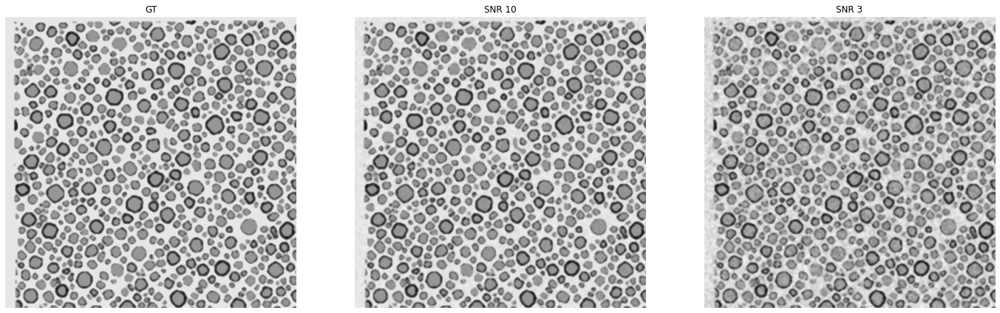

In [15]:
def preprocess_snr(img, kernel_size=3, sigma=0, median_blur=5):
    blurred_img = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
    denoised_img = cv2.medianBlur(blurred_img, median_blur)
    return denoised_img

images_preprocess = [preprocess_snr(im) for im in images]

fig, axes = plt.subplots(1, 3, figsize=(24, 12), facecolor='white')
for ax, im, nm in zip(axes.ravel(), images_preprocess, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.2 Results of Segmentations

For the segmentations, we will use the multi-Otsu thresholding method. We will use 3 classes, one for the background, one for the inner axon, and one for the outer axon; each class has its own characteristics, therefore, the histogram of the image can be considered **trimodal**. We will use the `threshold_multiotsu` function from `skimage.filters` to get the thresholds for the multi-Otsu thresholding method. We will then use the `digitize` function from `numpy` to get the regions of the image.

1. `threshold_multiotsu` function from `skimage.filters`:
This function calculates the thresholds for the multi-Otsu method, an extension of the Otsu thresholding method which we have discussed above. It computes multiple thresholds to separate the pixel intensities of an image into several classes. This is useful when you have more than just foreground and background to differentiate. The method works by minimizing the sum of the variances within each class, which results in an optimal separation of classes. The threshold_multiotsu function takes the input image and the number of classes as arguments and returns the computed threshold values. Also, we think it works more decently than manually setting the thresholds for the three classes.
2. `numpy.digitize` function:
This is a function that assigns each pixel value to a specific class (bin) based on the threshold values computed by the `threshold_multiotsu` function. It returns an array with the same shape as the input, where each pixel is replaced by the index of the bin it falls into.

These functions were chosen because they provide a convenient and efficient way to segment images using the multi-Otsu thresholding method. Multi-Otsu is a popular and widely used technique for image segmentation, especially when the histogram of pixel intensities is bimodal or multimodal. In this case, it is suitable for separating the background, inner axon, and outer axon.


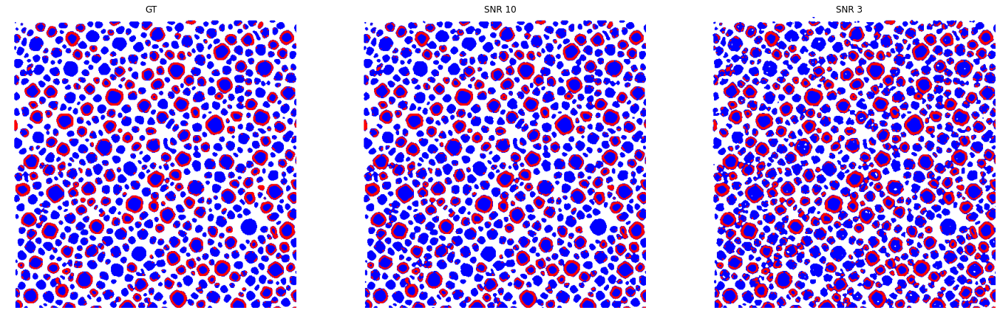

In [16]:
import numpy as np
from skimage.filters import threshold_multiotsu


def create_colored_segmentation(regions):
    color_image = np.zeros((regions.shape[0], regions.shape[1], 3), dtype=np.uint8)
    color_image[regions == 0] = [255, 0, 0]  # outer: red
    color_image[regions == 1] = [0, 0, 255]  # inner: blue
    color_image[regions == 2] = [255, 255, 255]  # bg: white
    return color_image


def segment_image_multiotsu(image, n_classes=3):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresholds = threshold_multiotsu(gray, classes=n_classes)
    regions = np.digitize(gray, bins=thresholds)
    color_image = create_colored_segmentation(regions)
    return color_image


images_segmented = [segment_image_multiotsu(im) for im in images_preprocess]

im_names = ["GT", "SNR 10", "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images_segmented, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()



The results are very satisfactory since the algorithm is able to segment correctly even for small objects. The pre-processing is efficient since the segmentation is very similar between $GT$ and lower $SNR$ images.


### 2.1.3 Radii histograms

For the radii histograms, we will use the `label` and `regionprops` functions from `skimage.measure`. We will use the `label` function to get the labels for the regions in the image, and then use the `regionprops` function to get the properties of the regions. We will then use the `area` property to get the area of the regions, and then use the area to calculate the radius of the regions.

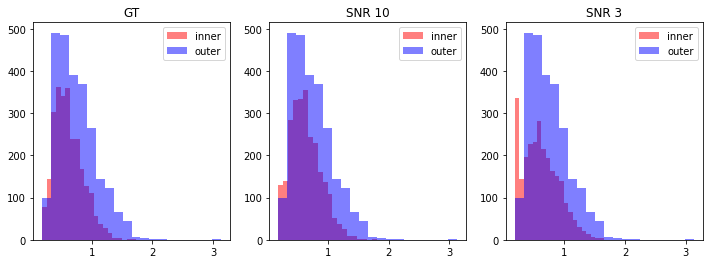

In [17]:
from skimage.measure import label, regionprops

def calculate_radii(segmented_image):

    inner_axon_mask = np.all(segmented_image == [0, 0, 255], axis=-1)
    outer_axon_mask = np.all(images_segmented[0] == [0, 0, 255], axis=-1).astype(float) \
        + np.all(images_segmented[0] == [255, 0, 0], axis=-1).astype(float)

    inner_axon_mask = skimage.morphology.area_opening(inner_axon_mask, 10)
    outer_axon_mask = skimage.morphology.area_opening(outer_axon_mask, 10)

    inner_axon_labels = label(inner_axon_mask)
    outer_axon_labels = label(outer_axon_mask)

    inner_radii, outer_radii = [], []

    inner, outer = 0, 0
    for region in regionprops(inner_axon_labels):
        area = region.area * 0.01  # Convert pixel area to µm
        radius = np.sqrt(area / np.pi)
        inner_radii.append(radius)
        inner+=1

    for region in regionprops(outer_axon_labels):
        area = region.area * 0.01  # Convert pixel area to µm
        radius = np.sqrt(area / np.pi)
        outer_radii.append(radius)
        outer+=1

    return inner_radii, outer_radii


radii_data = [calculate_radii(im) for im in images_segmented]

im_names = ["GT", "SNR 10", "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4), facecolor='white')
for ax, radii, nm in zip(axes.ravel(), radii_data, im_names):
    ax.hist(radii[0], color="red", label="inner", alpha=0.5, bins=20)
    ax.hist(radii[1], color="blue", label="outer", alpha=0.5, bins=20)
    ax.legend()
    ax.set_title(nm)
plt.show()


Now we describe the `calculate_radii` function. First, a mask is created for both regions from the segmented image. The region for the outer part is built under the following assumption: If there is an inner part (blue part) then we consider there is an outer part (red part) as well. Even if there is no detection of an outer part, we assume the edge was initially there but disappeared through the pre-processing. This was checked from initial observation of the images. A consequence of this is that there are more outer_radiuses detected than inner ones. (An example of the mask for each group is presented below).

Then, we use the function `skimage.morphology.area_opening` because it removes all bright structures of an image with a surface smaller than area_threshold. The object that represents less than 10 pixels in area are discarded.

After labeling each category the areas of all objects from each group are computed. From this, we get the corresponding radii.


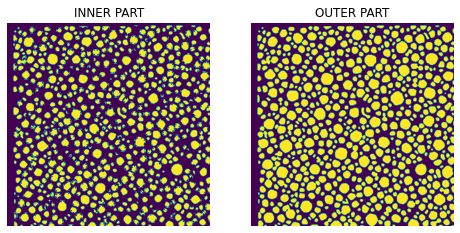

In [18]:
#Example from gt image
inner_mask = np.all(images_segmented[0] == [0, 0, 255], axis=-1)
outer_mask = np.all(images_segmented[0] == [0, 0, 255], axis=-1).astype(float) \
     + np.all(images_segmented[0] == [255, 0, 0], axis=-1).astype(float)

outer_mask = skimage.morphology.area_opening(outer_mask, 10)
inner_mask = skimage.morphology.area_opening(inner_mask, 10)


images = [inner_mask, outer_mask]
im_names = ["INNER PART", "OUTER PART"]
fig, axes = plt.subplots(1, 2, figsize=(8, 4), facecolor='white')
for ax, img, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(img[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

The results on the radiuses are then logical in the sense that they are usually higher. However as we have more data for outer part than for the inner one it is hard to clearly state a difference in the two groups. 

There were multiple attempts on the calculation of the inner and outer radii. We first tried to use the `area_filled` function of the `RegionProps` variable from `skimage.measure` subpackage. However, it is not stated that the version is not already available.

The functions `cv2.HoughCircles` were also tested to identify the circles in the image and the corresponding radiuses. It was unsucessful due to software compatibility issues that could not be resolved quickly.

A more optimal way of computing the outer radii would be to fill the detected objects. The area would then be more accurate. However, as seen before, if some parts of edges are missing, the entities are not closed. It becomes harder to fill them. An other preprocessing with non-local mean filter would then be interesting as a combination.

### 2.2 Low frequencies

The images presented here were submitted to low-pass filters which induces a 'wavy' behaviour observed below.

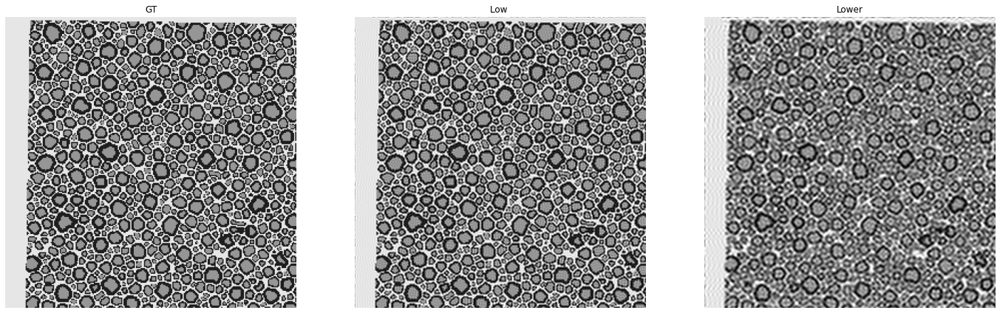

In [19]:
files = ["GT_3.png", "test_3_0.png", "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder + files[0])
lowfreq0 = cv2.imread(path_folder + files[1])
lowfreq1 = cv2.imread(path_folder + files[2])

images = [gt_3, lowfreq0, lowfreq1]
im_names = ["GT", "Low ", "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

To counter the effect of low frequencies over-representation in the image spectrum, one can apply a high-pass filter with the purpose of sharpening the edges. This can be done through a suitable kernel.

Multiple 3x3 kernel were tested but only two were kept for the final pre-processing.

After applying the high-pass filter, we also denoise the image.

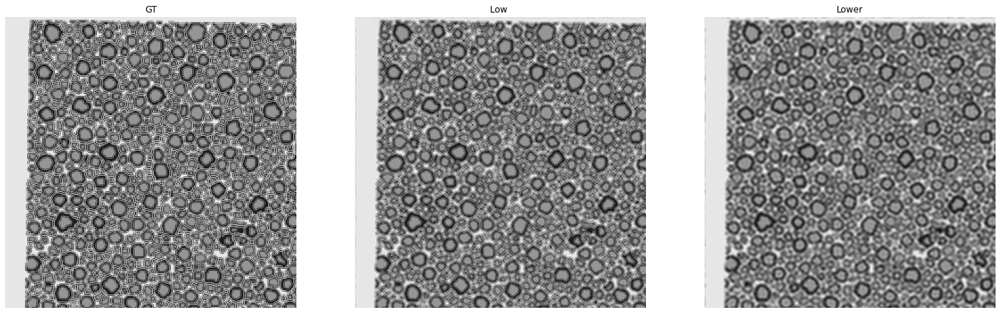

In [20]:
# First Kernel 

from skimage import morphology

files = ["GT_3.png", "test_3_0.png", "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder + files[0],flags=cv2.IMREAD_COLOR)
lowfreq0 = cv2.imread(path_folder + files[1],flags=cv2.IMREAD_COLOR)
lowfreq1 = cv2.imread(path_folder + files[2],flags=cv2.IMREAD_COLOR)

def low_freq_treatment(img):
    kernel = np.array([[-2, -2, -2],
                   [-2,10,-2],
                   [-2, -2, -2]])/(-6)
    
    image = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

    image = morphology.remove_small_objects(image, connectivity=1)

    return image

gt_3_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(gt_3))
lowfreq0_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(lowfreq0))
lowfreq1_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(lowfreq1))
    
images = [gt_3_filtered, lowfreq0_filtered, lowfreq1_filtered]
im_names = ["GT", "Low ", "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

The first kernel filter results in very sharp edges for the *GT* image that was already clear. The *Low* image preprocessed is quite satisfactory since it lost some of its bluriness and gained sharpness in the edges. The *Lower* image preprocessed has also lost some of its bluriness. However the edges are still not sharp enough for a very efficient segmentation.

The second kernel is compromise between sharping the edges of the *Low* images and not adding edges to the *GT* image. 

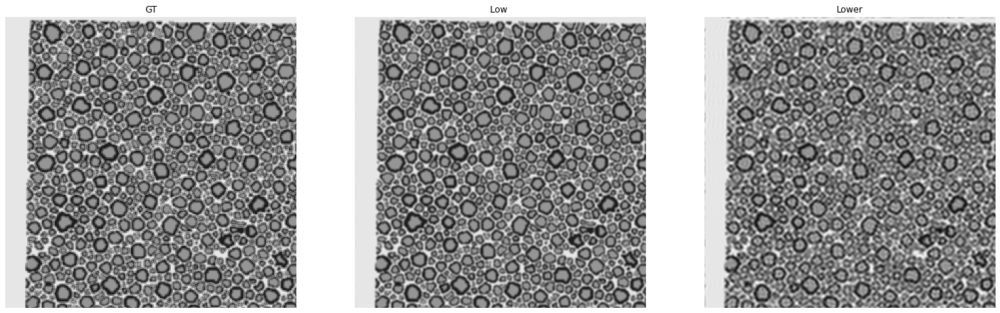

In [21]:
# Second kernel 

def low_freq_treatment(img):
    kernel = np.array([[-3, -3, -3],
                       [-3,10,-3],
                       [-3, -3, -3]])/(-14)
    
    image = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

    image = morphology.remove_small_objects(image, connectivity=1)

    return image

gt_3_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(gt_3))
lowfreq0_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(lowfreq0))
lowfreq1_filtered = cv2.fastNlMeansDenoisingColored(low_freq_treatment(lowfreq1))
    
images = [gt_3_filtered, lowfreq0_filtered, lowfreq1_filtered]
im_names = ["GT", "Low ", "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512, 0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

The preprocessing from the second kernel filtering is the most generic one of the two as all preprocessed image look very similar. A possible way of improving the algorithm would be to adapt the kernel depending on the frequency spectrum of the images. The kernel would more precisely depend on the ratio of $\frac{I_{high}}{I_{low}}$ the high frequency intensities over low frequency intensities.

### 2.2.2 Results Segmetations

We use the same segmentation technique as for SNR.

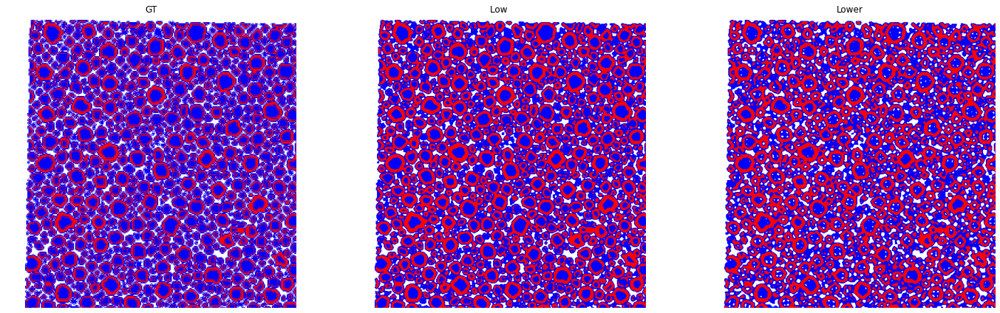

In [22]:

gt_3_segmented = segment_image_multiotsu(gt_3_filtered)
lowfreq0_segmented = segment_image_multiotsu(lowfreq0_filtered)
lowfreq1_segmented = segment_image_multiotsu(lowfreq1_filtered)

# Visualization
segmented_images = [gt_3_segmented, lowfreq0_segmented, lowfreq1_segmented]
segmented_im_names = ["GT", "Low ", "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), segmented_images, segmented_im_names):
    ax.imshow(im[0:512, 0:512], cmap='jet')
    ax.axis('off')
    ax.set_title(nm)
plt.show()


Because the filter is supposed to sharpen the edges, new unwanted edges are created for the *GT* image. The segmentation for the *Low* and *Lower* images are satisfactory considering how deteriorated the two images initially were.


### 2.2.3 Radii histrograms


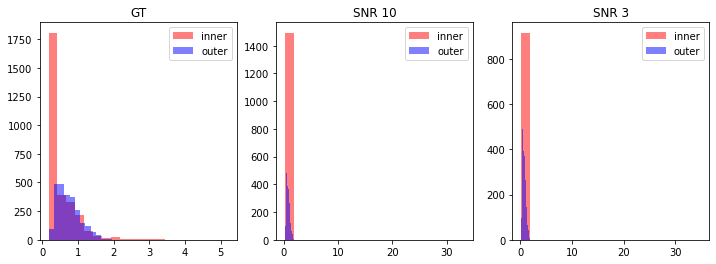

In [23]:
from skimage.measure import label, regionprops

def calculate_radii(segmented_image):
    
    inner_axon_mask = np.all(segmented_image == [0, 0, 255], axis=-1)
    outer_axon_mask = np.all(images_segmented[0] == [0, 0, 255], axis=-1).astype(float) \
        + np.all(images_segmented[0] == [255, 0, 0], axis=-1).astype(float)
    
    inner_axon_mask = skimage.morphology.area_opening(inner_axon_mask, 10)
    outer_axon_mask = skimage.morphology.area_opening(outer_axon_mask, 10)

    inner_axon_labels = label(inner_axon_mask)
    outer_axon_labels = label(outer_axon_mask)
    
    inner_radii, outer_radii = [], []

    inner, outer = 0, 0
    for region in regionprops(inner_axon_labels):
        area = region.area * 0.01  # Convert pixel area to µm    
        radius = np.sqrt(area / np.pi)
        inner_radii.append(radius)
        inner+=1
        
    for region in regionprops(outer_axon_labels):
        area = region.area * 0.01  # Convert pixel area to µm    
        radius = np.sqrt(area / np.pi)
        outer_radii.append(radius)
        outer+=1
        
    return inner_radii, outer_radii


radii_data = [calculate_radii(im) for im in segmented_images]

im_names = ["GT", "SNR 10", "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4), facecolor='white')
for ax, radii, nm in zip(axes.ravel(), radii_data, im_names):
    ax.hist(radii[0], color="red", label="inner", alpha=0.5, bins=20)
    ax.hist(radii[1], color="blue", label="outer", alpha=0.5, bins=20)
    ax.legend()
    ax.set_title(nm)
plt.show()


The segmentation produced above contains too many small objects and very few holes. On the one hand, some objects are considered as "connected" from the `label` function because there are no holes between them while there should be. The function counts larger areas than expected. It explains the range of the graphs above. On the other hand, the sharpening kernel creates artiphicial edges as stated before. It creates many small artiphicial objects (it is seen on the y-axis). The *GT* image is the most affected by this phenomena as it did not need the sharpening. The effect is clearly noticeable on its radii histogram. 

To improve the algorithm, one could change the connectivity settings for labeling the two groups. The possible improvement stated in the segmentation part would may have a positive effect on the radii measurement.

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

Preprocessing:

The preprocessing step aims to enhance the image quality and make the segmentation task easier. The following functions are used for this purpose:
- `skimage.restoration.denoise_tv_bregman`: This function is used to denoise the image using total variation (TV) regularization. The weight parameter determines the strength of denoising. Higher values produce stronger denoising, but may also remove important image details. In this case, a weight of 10 is chosen to balance noise removal and detail preservation.
- `skimage.filters.unsharp_mask`: This function is used to sharpen the image, which can help emphasize edges and improve the contrast between different regions. The radius parameter controls the size of the Gaussian blur applied to the image, and the amount parameter determines the strength of sharpening. In this case, a radius of 5 and an amount of 10 are chosen to highlight the edges in the image without introducing artifacts.
- Normalization: The image is normalized by scaling its intensity values to the range `[0, 1]`. This can improve the robustness of the segmentation algorithm and make the results more consistent across different images.

The functions in this implementation were chosen because they provide a convenient and efficient way to enhance image quality and segment the image using the multi-Otsu thresholding method.

However, the colors of the inner axons and the background are very similar, which makes the segmentation task more difficult.

We also noticed that there are so few inner axons detected. We considered using the `cv2.HoughCircles` function to detect the inner axons, but the problem was that nearly all outer axons are connected to each other, therefore the `cv2.HoughCircles` function would detect almost the whole image as a "circle".


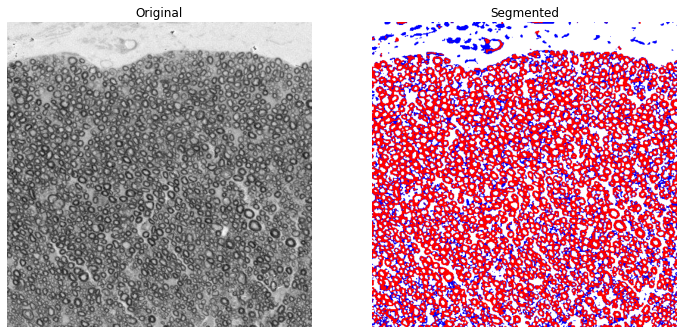

In [24]:
# Add your implementation and discussion
import cv2
import skimage.restoration
import skimage.filters
import numpy as np

files = ["extra_point.png"]
real_data = cv2.imread(path_folder + files[0])

# Preprocessing
data = skimage.restoration.denoise_tv_bregman(real_data, weight=10)
data = skimage.filters.unsharp_mask(data, radius=5, amount=10)
data = (data - np.min(data)) / (np.max(data) - np.min(data))
data = np.array(data * 255, dtype=np.uint8)

# Segmentation
data = segment_image_multiotsu(data)

# Plot original and segmented image
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(real_data)
axes[0].axis('off')
axes[0].set_title("Original")
axes[1].imshow(data)
axes[1].axis('off')
axes[1].set_title("Segmented")
plt.show()